In [1]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import urllib
import zipfile

import geopandas as gpd
import seaborn as sns
sns.set(style="whitegrid")
import libpysal as lps
from libpysal.weights import Queen, Rook, KNN
import pysal as ps
import pysal.viz as viz
import numpy as np
import pandas as pd
import shapely.geometry
from shapely.geometry import Point
import matplotlib.pyplot as plt
%matplotlib inline

import pyproj

import mapclassify
import warnings
warnings.simplefilter('ignore')

In [2]:
# Configure the download
url  = 'https://github.com/cusp-london/Spatial-Data-Analysis/blob/master/housing_in_london.csv?raw=true'
path = os.path.join("data","housing_in_london.csv")

# Download
r    = urllib.request.urlretrieve(url, path)

Data frame shape: (66641, 74)


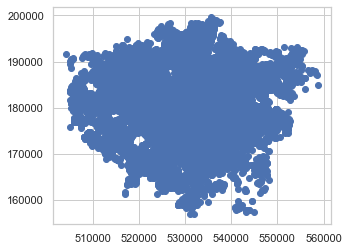

In [3]:
df0=pd.read_csv('data/listings.csv')
print("Data frame shape: " + str(df0.shape)) 

geometry = [Point(xy) for xy in zip(df0.longitude, df0.latitude)]
df0.drop(['longitude', 'latitude'], axis=1, inplace=True)
crs = {'init': 'epsg:4326'}
airbnb = gpd.GeoDataFrame(df0, crs=crs, geometry=geometry)
airbnb = airbnb.to_crs({'init': 'epsg:27700'})
airbnb.plot()
del(df0)

<AxesSubplot:>

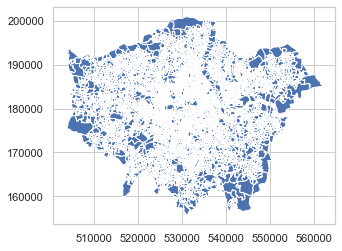

In [4]:
lsoas=gpd.read_file('data/LSOA_IMD2019.shp')
lsoas.plot()

In [5]:
lsoas

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,...,IMD2019_Cr,IMD2019_14,IMD2019_15,IMD2019_Ba,IMD2019_16,IMD2019_17,IMD2019_Li,IMD2019_18,IMD2019_19,geometry
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,...,-2.0,32662,10,29.5,7319,3,31.9,7789,3,"POLYGON ((532105.092 182011.230, 532162.491 18..."
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,...,-2.3,32789,10,24.4,11707,4,23.1,13070,4,"POLYGON ((532746.813 181786.891, 532671.688 18..."
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,...,-1.0,29363,9,40.1,2157,1,40.5,4092,2,"POLYGON ((532135.145 182198.119, 532158.250 18..."
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,...,-1.3,31059,10,39.9,2217,1,29.0,9397,3,"POLYGON ((533807.946 180767.770, 533649.063 18..."
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,...,-0.1,18848,6,45.2,1033,1,26.9,10629,4,"POLYGON ((545122.049 184314.931, 545271.917 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1352,1352,...,-0.2,19491,6,40.5,2042,1,12.5,21492,7,"POLYGON ((544642.680 179824.674, 544766.313 17..."
4831,E01033743,Greenwich 002H,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,2038,2038,...,0.2,13267,5,50.3,286,1,11.9,22054,7,"POLYGON ((546579.195 181097.813, 546687.036 18..."
4832,E01033744,Greenwich 007G,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1845,1728,...,0.4,10943,4,37.3,3095,1,14.2,19969,7,"POLYGON ((544536.486 179447.115, 544602.630 17..."
4833,E01033745,Greenwich 002I,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,1820,1820,...,-0.3,20703,7,45.1,1047,1,14.8,19362,6,"POLYGON ((546415.745 180152.270, 546320.715 18..."


In [6]:
lsoas.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4835 entries, 0 to 4834
Data columns (total 43 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   LSOA11CD    4835 non-null   object  
 1   LSOA11NM    4835 non-null   object  
 2   MSOA11CD    4835 non-null   object  
 3   MSOA11NM    4835 non-null   object  
 4   LAD11CD     4835 non-null   object  
 5   LAD11NM     4835 non-null   object  
 6   RGN11CD     4835 non-null   object  
 7   RGN11NM     4835 non-null   object  
 8   USUALRES    4835 non-null   int64   
 9   HHOLDRES    4835 non-null   int64   
 10  COMESTRES   4835 non-null   int64   
 11  POPDEN      4835 non-null   float64 
 12  HHOLDS      4835 non-null   int64   
 13  AVHHOLDSZ   4835 non-null   float64 
 14  IMD2019_LS  4835 non-null   object  
 15  IMD2019__1  4835 non-null   object  
 16  IMD2019_Lo  4835 non-null   object  
 17  IMD2019__2  4835 non-null   object  
 18  IMD2019_In  4835 non-null   float64 
 19

In [7]:
l=gpd.read_file('/Users/yixuangu/Desktop/final/GiGL_openspace_subset_(beta)_V4b/GiGL_openspace_subset_(beta)_V4b_region.shp')


In [8]:
l

,SiteName,SiteID,PrimaryUse,Borough,AreaHa,Easting,Northing,Qualifier,DataSource,DataVersio,ReleaseDat,Copyright,geometry
0,Alice Owen Playing Field,OS_Ba_0004,Playing fields,Barnet,3.7296,526771,194329,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((526923.852 194279.097 0.000, 52692..."
1,Arkley South Fields,OS_Ba_0010,Playing fields,Barnet,94.2257,522575,195230,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((522418.050 195665.551 0.000, 52242..."
2,Arrandene Open Space,OS_Ba_0012,Amenity green space,Barnet,24.5138,522633,191981,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((522403.547 192042.398 0.000, 52243..."
3,Avenue House Grounds,OS_Ba_0014,Park,Barnet,4.0571,525213,190275,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((525337.568 190323.770 0.000, 52533..."
4,Avondale Ave Park,OS_Ba_0015,Park,Barnet,1.3011,527794,194477,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((527704.247 194443.800 0.000, 52775..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4684,Vestry Road,OS_WF_0395,Amenity green space,Waltham Forest,0.0299,537788,189128,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((537792.516 189138.879 0.000, 53779..."
4685,Walthamstow Marshes - Coppermill Fields,OS_WF_0397,Common,Waltham Forest,6.7334,535214,187918,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((535516.896 187961.696 0.000, 53550..."
4686,Walthamstow Town Square Gardens,OS_WF_0398,Formal garden,Waltham Forest,0.8783,537190,189039,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((537177.616 189070.778 0.000, 53717..."
4687,Leyton Marshes,OS_WF_0403,Playing fields,Waltham Forest,9.9498,535594,186960,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((535361.625 187049.287 0.000, 53536..."


In [9]:

wgs84=pyproj.Proj("+init=epsg:4326") # LatLon with WGS84 datum used by GPS units and Google Earth
osgb36=pyproj.Proj("+init=epsg:27700") # UK Ordnance Survey, 1936 datum - this is the one used in the UK

l['longitude'], l['latitude'] = pyproj.transform(osgb36,wgs84,list(l['Easting']), list(l['Northing']))

In [10]:
l

,SiteName,SiteID,PrimaryUse,Borough,AreaHa,Easting,Northing,Qualifier,DataSource,DataVersio,ReleaseDat,Copyright,geometry,longitude,latitude
0,Alice Owen Playing Field,OS_Ba_0004,Playing fields,Barnet,3.7296,526771,194329,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((526923.852 194279.097 0.000, 52692...",-0.169662,51.633498
1,Arkley South Fields,OS_Ba_0010,Playing fields,Barnet,94.2257,522575,195230,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((522418.050 195665.551 0.000, 52242...",-0.229943,51.642525
2,Arrandene Open Space,OS_Ba_0012,Amenity green space,Barnet,24.5138,522633,191981,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((522403.547 192042.398 0.000, 52243...",-0.230242,51.613313
3,Avenue House Grounds,OS_Ba_0014,Park,Barnet,4.0571,525213,190275,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((525337.568 190323.770 0.000, 52533...",-0.193608,51.597414
4,Avondale Ave Park,OS_Ba_0015,Park,Barnet,1.3011,527794,194477,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((527704.247 194443.800 0.000, 52775...",-0.154834,51.634597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4684,Vestry Road,OS_WF_0395,Amenity green space,Waltham Forest,0.0299,537788,189128,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((537792.516 189138.879 0.000, 53779...",-0.012617,51.584173
4685,Walthamstow Marshes - Coppermill Fields,OS_WF_0397,Common,Waltham Forest,6.7334,535214,187918,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((535516.896 187961.696 0.000, 53550...",-0.050212,51.573923
4686,Walthamstow Town Square Gardens,OS_WF_0398,Formal garden,Waltham Forest,0.8783,537190,189039,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((537177.616 189070.778 0.000, 53717...",-0.021278,51.583520
4687,Leyton Marshes,OS_WF_0403,Playing fields,Waltham Forest,9.9498,535594,186960,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,"POLYGON Z ((535361.625 187049.287 0.000, 53536...",-0.045101,51.565223


<AxesSubplot:>

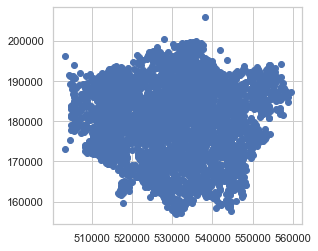

In [11]:
geometry = [Point(xy) for xy in zip(l.longitude, l.latitude)]
l.drop(['longitude', 'latitude'], axis=1, inplace=True)
crs = {'init': 'epsg:4326'}
green = gpd.GeoDataFrame(l, crs=crs, geometry=geometry)
green = green.to_crs({'init': 'epsg:27700'})
green.plot()

In [12]:
green

,SiteName,SiteID,PrimaryUse,Borough,AreaHa,Easting,Northing,Qualifier,DataSource,DataVersio,ReleaseDat,Copyright,geometry
0,Alice Owen Playing Field,OS_Ba_0004,Playing fields,Barnet,3.7296,526771,194329,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (526771.000 194329.000)
1,Arkley South Fields,OS_Ba_0010,Playing fields,Barnet,94.2257,522575,195230,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (522575.000 195230.000)
2,Arrandene Open Space,OS_Ba_0012,Amenity green space,Barnet,24.5138,522633,191981,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (522633.000 191981.000)
3,Avenue House Grounds,OS_Ba_0014,Park,Barnet,4.0571,525213,190275,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (525213.000 190275.000)
4,Avondale Ave Park,OS_Ba_0015,Park,Barnet,1.3011,527794,194477,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (527794.000 194477.000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4684,Vestry Road,OS_WF_0395,Amenity green space,Waltham Forest,0.0299,537788,189128,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (537788.000 189128.000)
4685,Walthamstow Marshes - Coppermill Fields,OS_WF_0397,Common,Waltham Forest,6.7334,535214,187918,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (535214.000 187918.000)
4686,Walthamstow Town Square Gardens,OS_WF_0398,Formal garden,Waltham Forest,0.8783,537190,189039,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (537190.000 189039.000)
4687,Leyton Marshes,OS_WF_0403,Playing fields,Waltham Forest,9.9498,535594,186960,Centroid,Data source: various,4b,February 2021,Created by Greenspace Information for Greater ...,POINT (535594.000 186960.000)


Join Airbnb data with LSOAs by **spatial join** function `sjoin`.

In [13]:
df = gpd.sjoin(green, lsoas, how="inner", op='within')
# check the columns upon spatial join
df.columns.to_list()

['SiteName',
 'SiteID',
 'PrimaryUse',
 'Borough',
 'AreaHa',
 'Easting',
 'Northing',
 'Qualifier',
 'DataSource',
 'DataVersio',
 'ReleaseDat',
 'Copyright',
 'geometry',
 'index_right',
 'LSOA11CD',
 'LSOA11NM',
 'MSOA11CD',
 'MSOA11NM',
 'LAD11CD',
 'LAD11NM',
 'RGN11CD',
 'RGN11NM',
 'USUALRES',
 'HHOLDRES',
 'COMESTRES',
 'POPDEN',
 'HHOLDS',
 'AVHHOLDSZ',
 'IMD2019_LS',
 'IMD2019__1',
 'IMD2019_Lo',
 'IMD2019__2',
 'IMD2019_In',
 'IMD2019__3',
 'IMD2019__4',
 'IMD2019__5',
 'IMD2019__6',
 'IMD2019__7',
 'IMD2019_Em',
 'IMD2019__8',
 'IMD2019__9',
 'IMD2019_Ed',
 'IMD2019_10',
 'IMD2019_11',
 'IMD2019_He',
 'IMD2019_12',
 'IMD2019_13',
 'IMD2019_Cr',
 'IMD2019_14',
 'IMD2019_15',
 'IMD2019_Ba',
 'IMD2019_16',
 'IMD2019_17',
 'IMD2019_Li',
 'IMD2019_18',
 'IMD2019_19']

In [14]:
df

,SiteName,SiteID,PrimaryUse,Borough,AreaHa,Easting,Northing,Qualifier,DataSource,DataVersio,...,IMD2019_13,IMD2019_Cr,IMD2019_14,IMD2019_15,IMD2019_Ba,IMD2019_16,IMD2019_17,IMD2019_Li,IMD2019_18,IMD2019_19
0,Alice Owen Playing Field,OS_Ba_0004,Playing fields,Barnet,3.7296,526771,194329,Centroid,Data source: various,4b,...,9,-0.1,18549,6,25.8,10384,4,18.9,16080,5
1,Arkley South Fields,OS_Ba_0010,Playing fields,Barnet,94.2257,522575,195230,Centroid,Data source: various,4b,...,8,0.5,9251,3,38.4,2694,1,13.4,20685,7
106,Barnet Gate Wood,OS_Ba_0422,Public woodland,Barnet,4.0928,521566,194814,Centroid,Data source: various,4b,...,8,0.5,9251,3,38.4,2694,1,13.4,20685,7
2,Arrandene Open Space,OS_Ba_0012,Amenity green space,Barnet,24.5138,522633,191981,Centroid,Data source: various,4b,...,9,0.2,13597,5,30.4,6713,3,24.1,12365,4
56,Mill Hill Cemetery,OS_Ba_0211,Cemetery/churchyard,Barnet,6.9730,523155,191819,Centroid,Data source: various,4b,...,9,0.2,13597,5,30.4,6713,3,24.1,12365,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4670,Leigh Road,OS_WF_0372,Amenity green space,Waltham Forest,0.0132,538419,187494,Centroid,Data source: various,4b,...,6,0.5,8815,3,36.8,3267,1,36.0,5822,2
4676,Queens Road Playground,OS_WF_0383,Play space,Waltham Forest,0.0466,536718,188235,Centroid,Data source: various,4b,...,5,1.0,3261,1,42.5,1548,1,18.5,16413,5
4683,Thomas Gamuel Park,OS_WF_0394,Park,Waltham Forest,0.9709,537123,188187,Centroid,Data source: various,4b,...,5,1.0,3261,1,42.5,1548,1,18.5,16413,5
4678,South Grove Road Open Space,OS_WF_0389,Amenity green space,Waltham Forest,0.0965,536743,188826,Centroid,Data source: various,4b,...,4,0.8,5595,2,44.0,1236,1,34.0,6698,3


In [15]:
f = {'AreaHa':['sum']}
g = df.groupby(['LSOA11CD']).agg(f)
g = g.AreaHa.reset_index().set_index('LSOA11CD').rename(columns=lambda x: x.title() + " green")
lsoa_new = pd.merge(lsoas, g, how='left', left_on='LSOA11CD', right_index=True)

In [16]:
lsoa_new

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,...,IMD2019_14,IMD2019_15,IMD2019_Ba,IMD2019_16,IMD2019_17,IMD2019_Li,IMD2019_18,IMD2019_19,geometry,Sum green
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,...,32662,10,29.5,7319,3,31.9,7789,3,"POLYGON ((532105.092 182011.230, 532162.491 18...",0.4990
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,...,32789,10,24.4,11707,4,23.1,13070,4,"POLYGON ((532746.813 181786.891, 532671.688 18...",4.0805
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,...,29363,9,40.1,2157,1,40.5,4092,2,"POLYGON ((532135.145 182198.119, 532158.250 18...",NaN
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,...,31059,10,39.9,2217,1,29.0,9397,3,"POLYGON ((533807.946 180767.770, 533649.063 18...",2.1140
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,...,18848,6,45.2,1033,1,26.9,10629,4,"POLYGON ((545122.049 184314.931, 545271.917 18...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1352,1352,...,19491,6,40.5,2042,1,12.5,21492,7,"POLYGON ((544642.680 179824.674, 544766.313 17...",NaN
4831,E01033743,Greenwich 002H,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,2038,2038,...,13267,5,50.3,286,1,11.9,22054,7,"POLYGON ((546579.195 181097.813, 546687.036 18...",16.2055
4832,E01033744,Greenwich 007G,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1845,1728,...,10943,4,37.3,3095,1,14.2,19969,7,"POLYGON ((544536.486 179447.115, 544602.630 17...",NaN
4833,E01033745,Greenwich 002I,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,1820,1820,...,20703,7,45.1,1047,1,14.8,19362,6,"POLYGON ((546415.745 180152.270, 546320.715 18...",8.8703


In [17]:
lsoa_new.columns

Index(['LSOA11CD', 'LSOA11NM', 'MSOA11CD', 'MSOA11NM', 'LAD11CD', 'LAD11NM',
       'RGN11CD', 'RGN11NM', 'USUALRES', 'HHOLDRES', 'COMESTRES', 'POPDEN',
       'HHOLDS', 'AVHHOLDSZ', 'IMD2019_LS', 'IMD2019__1', 'IMD2019_Lo',
       'IMD2019__2', 'IMD2019_In', 'IMD2019__3', 'IMD2019__4', 'IMD2019__5',
       'IMD2019__6', 'IMD2019__7', 'IMD2019_Em', 'IMD2019__8', 'IMD2019__9',
       'IMD2019_Ed', 'IMD2019_10', 'IMD2019_11', 'IMD2019_He', 'IMD2019_12',
       'IMD2019_13', 'IMD2019_Cr', 'IMD2019_14', 'IMD2019_15', 'IMD2019_Ba',
       'IMD2019_16', 'IMD2019_17', 'IMD2019_Li', 'IMD2019_18', 'IMD2019_19',
       'geometry', 'Sum green'],
      dtype='object')

In [18]:
lsoa_new.drop(['MSOA11CD', 'MSOA11NM', 'LAD11CD', 'LAD11NM', 'RGN11CD', 'RGN11NM', 
           'IMD2019_LS', 'IMD2019__1', 'IMD2019_Lo', 'IMD2019__2', 'IMD2019__3', 'IMD2019__4',
           'IMD2019__6', 'IMD2019__7', 'IMD2019__8', 'IMD2019__9', 'IMD2019_10', 'IMD2019_11',
           'IMD2019_12', 'IMD2019_13', 'IMD2019_14', 'IMD2019_15', 'IMD2019_16', 'IMD2019_17',
           'IMD2019_18', 'IMD2019_19'], axis=1, inplace=True)

In [19]:
lsoa_new.rename(columns={'IMD2019_In':'IMDScore', 'IMD2019__5':'IncScore',
                    'IMD2019_Em':'EmpScore', 'IMD2019_Ed':'EduScore',
                    'IMD2019_He':'HeaScore', 'IMD2019_Cr': 'CriScore',
                    'IMD2019_Ba':'BaHScore','IMD2019_Li':'EnvScore'}, inplace=True)
lsoa_new.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4835 entries, 0 to 4834
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   LSOA11CD   4835 non-null   object  
 1   LSOA11NM   4835 non-null   object  
 2   USUALRES   4835 non-null   int64   
 3   HHOLDRES   4835 non-null   int64   
 4   COMESTRES  4835 non-null   int64   
 5   POPDEN     4835 non-null   float64 
 6   HHOLDS     4835 non-null   int64   
 7   AVHHOLDSZ  4835 non-null   float64 
 8   IMDScore   4835 non-null   float64 
 9   IncScore   4835 non-null   float64 
 10  EmpScore   4835 non-null   float64 
 11  EduScore   4835 non-null   float64 
 12  HeaScore   4835 non-null   float64 
 13  CriScore   4835 non-null   float64 
 14  BaHScore   4835 non-null   float64 
 15  EnvScore   4835 non-null   float64 
 16  geometry   4835 non-null   geometry
 17  Sum green  2417 non-null   float64 
dtypes: float64(11), geometry(1), int64(4), object(2)
memory usag

In [20]:
dff=pd.read_csv('data/MPS LSOA Level Crime (most recent 24 months).csv')
dff

,LSOA Code,LSOA Name,Borough,Major Category,Minor Category,202003,202004,202005,202006,202007,...,202105,202106,202107,202108,202109,202110,202111,202112,202201,202202
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Arson and Criminal Damage,Arson,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage,0,0,1,0,0,...,1,1,0,0,0,0,0,1,2,1
2,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Burglary,Burglary Business and Community,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Burglary,Domestic Burglary,0,0,0,0,0,...,0,0,0,0,0,1,1,1,0,0
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Drug Offences,Drug Trafficking,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103081,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Interfering with a Motor Vehicle,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
103082,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Theft from a Motor Vehicle,0,0,2,1,2,...,1,2,1,0,1,0,0,0,0,2
103083,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Theft or Taking of a Motor Vehicle,0,0,0,1,1,...,1,0,2,0,0,0,0,0,0,0
103084,E01033746,Greenwich 038E,Greenwich,Violence Against the Person,Violence with Injury,0,0,0,0,2,...,0,1,0,0,0,1,1,0,0,0


In [21]:
dff['twoyears_crime']=dff['202003']+dff['202004']+dff['202005']+dff['202006']+dff['202007']+dff['202008']+dff['202009']+dff['202010']+dff['202011']+dff['202012']+dff['202101']+dff['202102']+dff['202103']+dff['202104']+dff['202105']+dff['202106']+dff['202107']+dff['202108']+dff['202109']+dff['202110']+dff['202111']+dff['202112']+dff['202201']+dff['202202']

In [22]:
dff

,LSOA Code,LSOA Name,Borough,Major Category,Minor Category,202003,202004,202005,202006,202007,...,202106,202107,202108,202109,202110,202111,202112,202201,202202,twoyears_crime
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Arson and Criminal Damage,Arson,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
1,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage,0,0,1,0,0,...,1,0,0,0,0,0,1,2,1,9
2,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Burglary,Burglary Business and Community,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Burglary,Domestic Burglary,0,0,0,0,0,...,0,0,0,0,1,1,1,0,0,9
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Drug Offences,Drug Trafficking,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103081,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Interfering with a Motor Vehicle,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
103082,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Theft from a Motor Vehicle,0,0,2,1,2,...,2,1,0,1,0,0,0,0,2,21
103083,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Theft or Taking of a Motor Vehicle,0,0,0,1,1,...,0,2,0,0,0,0,0,0,0,8
103084,E01033746,Greenwich 038E,Greenwich,Violence Against the Person,Violence with Injury,0,0,0,0,2,...,1,0,0,0,1,1,0,0,0,7


In [23]:
f2 = {'twoyears_crime':['sum']}
g2 = dff.groupby(['LSOA Code']).agg(f2)
g2 = g2['twoyears_crime'].reset_index().set_index('LSOA Code').rename(columns=lambda x: x.title() + " crime")
lsoa_new_2 = pd.merge(lsoa_new, g2, how='left', left_on='LSOA11CD', right_index=True)

In [24]:
lsoa_new_2

,LSOA11CD,LSOA11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,IMDScore,IncScore,EmpScore,EduScore,HeaScore,CriScore,BaHScore,EnvScore,geometry,Sum green,Sum crime
0,E01000001,City of London 001A,1465,1465,0,112.9,876,1.7,6.2,0.0,0.0,0.0,-1.7,-2.0,29.5,31.9,"POLYGON ((532105.092 182011.230, 532162.491 18...",0.4990,NaN
1,E01000002,City of London 001B,1436,1436,0,62.9,830,1.7,5.1,0.0,0.0,0.1,-1.1,-2.3,24.4,23.1,"POLYGON ((532746.813 181786.891, 532671.688 18...",4.0805,NaN
2,E01000003,City of London 001C,1346,1250,96,227.7,817,1.5,19.4,0.1,0.1,5.8,-0.1,-1.0,40.1,40.5,"POLYGON ((532135.145 182198.119, 532158.250 18...",NaN,NaN
3,E01000005,City of London 001E,985,985,0,52.0,467,2.1,28.7,0.2,0.1,22.3,-0.1,-1.3,39.9,29.0,"POLYGON ((533807.946 180767.770, 533649.063 18...",2.1140,NaN
4,E01000006,Barking and Dagenham 016A,1703,1699,4,116.2,543,3.1,19.8,0.1,0.1,14.8,-0.4,-0.1,45.2,26.9,"POLYGON ((545122.049 184314.931, 545271.917 18...",NaN,207.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,1352,1352,0,107.6,581,2.3,13.1,0.1,0.0,7.8,-0.4,-0.2,40.5,12.5,"POLYGON ((544642.680 179824.674, 544766.313 17...",NaN,115.0
4831,E01033743,Greenwich 002H,2038,2038,0,20.4,663,3.1,21.0,0.1,0.1,9.2,-0.2,0.2,50.3,11.9,"POLYGON ((546579.195 181097.813, 546687.036 18...",16.2055,517.0
4832,E01033744,Greenwich 007G,1845,1728,117,125.8,646,2.7,29.4,0.2,0.1,17.9,0.9,0.4,37.3,14.2,"POLYGON ((544536.486 179447.115, 544602.630 17...",NaN,253.0
4833,E01033745,Greenwich 002I,1820,1820,0,32.3,591,3.1,22.1,0.2,0.1,9.8,-0.2,-0.3,45.1,14.8,"POLYGON ((546415.745 180152.270, 546320.715 18...",8.8703,237.0


In [25]:
df3 = pd.read_excel('data/atlas_losa.xlsx')

In [26]:
df3

,Codes,Names,2013 Population Density,2011 numbder of all households,2011 census Population,2011 Working-age population,2011 employment rate,2011 unemployment rate,Mean Annual Household Income estimate (£),unemployment rate
0,E01000907,Camden 001A,136.753731,627,1430,972,58.568738,9.874826,39985.100588,9.874826
1,E01000908,Camden 001B,94.114286,827,1581,1078,62.331081,8.043217,42393.697668,8.043217
2,E01000909,Camden 001C,71.828521,661,1614,1081,65.682362,4.853273,77369.830951,4.853273
3,E01000912,Camden 001D,18.446602,700,1589,1103,58.785425,8.844340,41737.141713,8.844340
4,E01000913,Camden 001E,11.298701,722,1710,1085,71.772939,2.076843,96648.892842,2.076843
...,...,...,...,...,...,...,...,...,...,...
4830,E01004328,Waltham Forest 028B,182.170543,671,1840,1382,61.362057,9.767442,35125.345999,9.767442
4831,E01004329,Waltham Forest 028C,172.437554,671,1931,1423,54.374159,9.232264,33250.617751,9.232264
4832,E01004330,Waltham Forest 028D,184.365163,625,1834,1342,58.856346,7.029703,37154.377778,7.029703
4833,E01004331,Waltham Forest 028E,182.956685,675,1856,1332,54.755043,8.606557,32862.115019,8.606557


In [27]:
d=df3.join(lsoa_new_2.set_index(['LSOA11CD']), on=['Codes'], how='left')
d

,Codes,Names,2013 Population Density,2011 numbder of all households,2011 census Population,2011 Working-age population,2011 employment rate,2011 unemployment rate,Mean Annual Household Income estimate (£),unemployment rate,...,IncScore,EmpScore,EduScore,HeaScore,CriScore,BaHScore,EnvScore,geometry,Sum green,Sum crime
0,E01000907,Camden 001A,136.753731,627,1430,972,58.568738,9.874826,39985.100588,9.874826,...,0.2,0.2,19.1,0.3,1.1,21.1,18.5,"POLYGON ((528920.902 186917.161, 528935.135 18...",7.9068,220.0
1,E01000908,Camden 001B,94.114286,827,1581,1078,62.331081,8.043217,42393.697668,8.043217,...,0.2,0.2,15.1,-0.2,0.2,23.2,33.8,"POLYGON ((528559.017 186904.239, 528561.860 18...",NaN,214.0
2,E01000909,Camden 001C,71.828521,661,1614,1081,65.682362,4.853273,77369.830951,4.853273,...,0.1,0.1,2.9,-1.5,0.2,16.7,31.5,"POLYGON ((528368.346 186709.790, 528394.000 18...",NaN,185.0
3,E01000912,Camden 001D,18.446602,700,1589,1103,58.785425,8.844340,41737.141713,8.844340,...,0.2,0.1,11.2,-0.2,0.7,18.9,24.4,"POLYGON ((527916.285 186376.944, 528026.000 18...",74.6033,399.0
4,E01000913,Camden 001E,11.298701,722,1710,1085,71.772939,2.076843,96648.892842,2.076843,...,0.0,0.0,1.6,-1.6,1.0,17.1,31.7,"POLYGON ((527118.188 187603.641, 527308.000 18...",99.5456,642.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01004328,Waltham Forest 028B,182.170543,671,1840,1382,61.362057,9.767442,35125.345999,9.767442,...,0.1,0.1,13.9,-0.4,0.4,36.4,54.3,"POLYGON ((539425.622 186339.169, 539416.149 18...",0.2275,294.0
4831,E01004329,Waltham Forest 028C,172.437554,671,1931,1423,54.374159,9.232264,33250.617751,9.232264,...,0.1,0.1,17.4,-0.1,-0.2,38.5,44.2,"POLYGON ((539906.002 186314.960, 539940.976 18...",0.5196,257.0
4832,E01004330,Waltham Forest 028D,184.365163,625,1834,1342,58.856346,7.029703,37154.377778,7.029703,...,0.1,0.0,9.9,-0.8,0.2,32.2,45.3,"POLYGON ((539455.890 186230.420, 539496.056 18...",NaN,189.0
4833,E01004331,Waltham Forest 028E,182.956685,675,1856,1332,54.755043,8.606557,32862.115019,8.606557,...,0.2,0.1,16.2,-0.2,-0.4,42.2,32.5,"POLYGON ((540216.558 185919.279, 540146.754 18...",NaN,184.0


In [28]:
df1=pd.read_csv('data/housing_in_london.csv')
df1

,Code,Area,Year,Value,Measure
0,E01000001,City of London 001A,Year ending Dec 2017,1204928.0,Mean
1,E01000002,City of London 001B,Year ending Dec 2017,991549.0,Mean
2,E01000003,City of London 001C,Year ending Dec 2017,913007.0,Mean
3,E01000005,City of London 001E,Year ending Dec 2017,NaN,Mean
4,E01000006,Barking and Dagenham 016A,Year ending Dec 2017,354300.0,Mean
...,...,...,...,...,...
4830,E01033742,Greenwich 007F,Year ending Dec 2017,315553.0,Mean
4831,E01033743,Greenwich 002H,Year ending Dec 2017,286682.0,Mean
4832,E01033744,Greenwich 007G,Year ending Dec 2017,294493.0,Mean
4833,E01033745,Greenwich 002I,Year ending Dec 2017,310000.0,Mean


In [29]:
db=df1.join(d.set_index(['Codes']), on=['Code'], how='left')
db

,Code,Area,Year,Value,Measure,Names,2013 Population Density,2011 numbder of all households,2011 census Population,2011 Working-age population,...,IncScore,EmpScore,EduScore,HeaScore,CriScore,BaHScore,EnvScore,geometry,Sum green,Sum crime
0,E01000001,City of London 001A,Year ending Dec 2017,1204928.0,Mean,City of London 001A,113.559322,876,1465,1082,...,0.0,0.0,0.0,-1.7,-2.0,29.5,31.9,"POLYGON ((532105.092 182011.230, 532162.491 18...",0.4990,NaN
1,E01000002,City of London 001B,Year ending Dec 2017,991549.0,Mean,City of London 001B,63.704028,830,1436,1024,...,0.0,0.0,0.1,-1.1,-2.3,24.4,23.1,"POLYGON ((532746.813 181786.891, 532671.688 18...",4.0805,NaN
2,E01000003,City of London 001C,Year ending Dec 2017,913007.0,Mean,City of London 001C,229.610829,817,1346,988,...,0.1,0.1,5.8,-0.1,-1.0,40.1,40.5,"POLYGON ((532135.145 182198.119, 532158.250 18...",NaN,NaN
3,E01000005,City of London 001E,Year ending Dec 2017,NaN,Mean,City of London 001E,61.814346,467,985,694,...,0.2,0.1,22.3,-0.1,-1.3,39.9,29.0,"POLYGON ((533807.946 180767.770, 533649.063 18...",2.1140,NaN
4,E01000006,Barking and Dagenham 016A,Year ending Dec 2017,354300.0,Mean,Barking and Dagenham 016A,116.916780,543,1703,1176,...,0.1,0.1,14.8,-0.4,-0.1,45.2,26.9,"POLYGON ((545122.049 184314.931, 545271.917 18...",NaN,207.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,Year ending Dec 2017,315553.0,Mean,Greenwich 007F,120.286396,581,1352,1064,...,0.1,0.0,7.8,-0.4,-0.2,40.5,12.5,"POLYGON ((544642.680 179824.674, 544766.313 17...",NaN,115.0
4831,E01033743,Greenwich 002H,Year ending Dec 2017,286682.0,Mean,Greenwich 002H,21.046848,663,2038,1227,...,0.1,0.1,9.2,-0.2,0.2,50.3,11.9,"POLYGON ((546579.195 181097.813, 546687.036 18...",16.2055,517.0
4832,E01033744,Greenwich 007G,Year ending Dec 2017,294493.0,Mean,Greenwich 007G,128.629857,646,1845,1215,...,0.2,0.1,17.9,0.9,0.4,37.3,14.2,"POLYGON ((544536.486 179447.115, 544602.630 17...",NaN,253.0
4833,E01033745,Greenwich 002I,Year ending Dec 2017,310000.0,Mean,Greenwich 002I,34.202128,591,1820,1161,...,0.2,0.1,9.8,-0.2,-0.3,45.1,14.8,"POLYGON ((546415.745 180152.270, 546320.715 18...",8.8703,237.0


In [30]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4835 entries, 0 to 4834
Data columns (total 32 columns):
 #   Column                                     Non-Null Count  Dtype   
---  ------                                     --------------  -----   
 0   Code                                       4835 non-null   object  
 1   Area                                       4835 non-null   object  
 2   Year                                       4835 non-null   object  
 3   Value                                      4543 non-null   float64 
 4   Measure                                    4835 non-null   object  
 5   Names                                      4835 non-null   object  
 6   2013 Population Density                    4835 non-null   float64 
 7   2011 numbder of all households             4835 non-null   int64   
 8   2011 census Population                     4835 non-null   int64   
 9   2011 Working-age population                4835 non-null   int64   
 10  2011 employm

In [31]:
db['Green space per capita']=db['Sum green']/db['2011 census Population']
db['crimes per capita']=db['Sum crime']/db['2011 census Population']
db['working age rate']=db['2011 Working-age population']/db['2011 census Population']

In [32]:
db

,Code,Area,Year,Value,Measure,Names,2013 Population Density,2011 numbder of all households,2011 census Population,2011 Working-age population,...,HeaScore,CriScore,BaHScore,EnvScore,geometry,Sum green,Sum crime,Green space per capita,crimes per capita,working age rate
0,E01000001,City of London 001A,Year ending Dec 2017,1204928.0,Mean,City of London 001A,113.559322,876,1465,1082,...,-1.7,-2.0,29.5,31.9,"POLYGON ((532105.092 182011.230, 532162.491 18...",0.4990,NaN,0.000341,NaN,0.738567
1,E01000002,City of London 001B,Year ending Dec 2017,991549.0,Mean,City of London 001B,63.704028,830,1436,1024,...,-1.1,-2.3,24.4,23.1,"POLYGON ((532746.813 181786.891, 532671.688 18...",4.0805,NaN,0.002842,NaN,0.713092
2,E01000003,City of London 001C,Year ending Dec 2017,913007.0,Mean,City of London 001C,229.610829,817,1346,988,...,-0.1,-1.0,40.1,40.5,"POLYGON ((532135.145 182198.119, 532158.250 18...",NaN,NaN,NaN,NaN,0.734027
3,E01000005,City of London 001E,Year ending Dec 2017,NaN,Mean,City of London 001E,61.814346,467,985,694,...,-0.1,-1.3,39.9,29.0,"POLYGON ((533807.946 180767.770, 533649.063 18...",2.1140,NaN,0.002146,NaN,0.704569
4,E01000006,Barking and Dagenham 016A,Year ending Dec 2017,354300.0,Mean,Barking and Dagenham 016A,116.916780,543,1703,1176,...,-0.4,-0.1,45.2,26.9,"POLYGON ((545122.049 184314.931, 545271.917 18...",NaN,207.0,NaN,0.121550,0.690546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,Year ending Dec 2017,315553.0,Mean,Greenwich 007F,120.286396,581,1352,1064,...,-0.4,-0.2,40.5,12.5,"POLYGON ((544642.680 179824.674, 544766.313 17...",NaN,115.0,NaN,0.085059,0.786982
4831,E01033743,Greenwich 002H,Year ending Dec 2017,286682.0,Mean,Greenwich 002H,21.046848,663,2038,1227,...,-0.2,0.2,50.3,11.9,"POLYGON ((546579.195 181097.813, 546687.036 18...",16.2055,517.0,0.007952,0.253680,0.602061
4832,E01033744,Greenwich 007G,Year ending Dec 2017,294493.0,Mean,Greenwich 007G,128.629857,646,1845,1215,...,0.9,0.4,37.3,14.2,"POLYGON ((544536.486 179447.115, 544602.630 17...",NaN,253.0,NaN,0.137127,0.658537
4833,E01033745,Greenwich 002I,Year ending Dec 2017,310000.0,Mean,Greenwich 002I,34.202128,591,1820,1161,...,-0.2,-0.3,45.1,14.8,"POLYGON ((546415.745 180152.270, 546320.715 18...",8.8703,237.0,0.004874,0.130220,0.637912


In [33]:
db_new=db.fillna(0)

In [34]:
db_geo = gpd.GeoDataFrame(db_new, geometry='geometry')
db_geo.to_file(driver='ESRI Shapefile', filename='data/lsoa_IMD_housing3.shp')

In [35]:
gdf=gpd.read_file('data/lsoa_IMD_housing3.shp')
gdf.columns

Index(['Code', 'Area', 'Year', 'Value', 'Measure', 'Names', '2013 Popul',
       '2011 numbd', '2011 censu', '2011 Worki', '2011 emplo', '2011 unemp',
       'Mean Annua', 'unemployme', 'LSOA11NM', 'USUALRES', 'HHOLDRES',
       'COMESTRES', 'POPDEN', 'HHOLDS', 'AVHHOLDSZ', 'IMDScore', 'IncScore',
       'EmpScore', 'EduScore', 'HeaScore', 'CriScore', 'BaHScore', 'EnvScore',
       'Sum green', 'Sum crime', 'Green spac', 'crimes per', 'working ag',
       'geometry'],
      dtype='object')

In [36]:
# read the .dbf file from shapefile data
f = lps.io.open('data/lsoa_IMD_housing3.dbf','r')
# Read in the housing price (dependent variable) into an array y
y = np.array(f.by_col['Value'])
y.shape = (len(y),1)
# value for independent variables into a one dimmensional array X. 

X= []
X.append(f.by_col['IncScore']) # Income score in 2019
X.append(f.by_col['EduScore']) # Education score in 2019
X.append(f.by_col['BaHScore']) # Barrier to Housing Services score in 2019
X.append(f.by_col['IMDScore']) # Deprivation index in 2019
X.append(f.by_col['Green spac']) # the green area
X.append(f.by_col['crimes per']) # crime rate
X.append(f.by_col['working ag']) # working age population rate
X.append(f.by_col['unemployme']) # unemployment rate
X.append(f.by_col['2011 censu']) # census population
X.append(f.by_col['2013 Popul']) # population density
X.append(f.by_col['2011 numbd']) # number of households
X = np.array(X).T

In [37]:
import spreg
m1 = spreg.OLS(y, X, name_y = 'Housing Price', 
                        name_x = ['IncScore', 'EduScore', 'BaHScore', 'IMDScore', 'Green space per capita','crimes per capita','working age rate','unemployment rate','population','population density','number of households'], 
                        name_ds = 'lsoa_IMD_housing3')
print(m1.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :lsoa_IMD_housing3
Weights matrix      :        None
Dependent Variable  :Housing Price                Number of Observations:        4835
Mean dependent var  : 571522.2577                Number of Variables   :          12
S.D. dependent var  : 468796.0288                Degrees of Freedom    :        4823
R-squared           :      0.2967
Adjusted R-squared  :      0.2951
Sum squared residual:747116504890554.500                F-statistic           :    185.0085
Sigma-square        :154907009100.260                Prob(F-statistic)     :           0
S.E. of regression  :  393582.277                Log likelihood        :  -69144.085
Sigma-square ML     :154522544961.852                Akaike info criterion :  138312.170
S.E of regression ML: 393093.5575                Schwarz criterion     :  138389.974

--------------------------------------------------------

In [38]:
import statsmodels.api as sm
x = ['IncScore', 'EduScore', 'BaHScore', 'IMDScore', 'Green spac','crimes per','working ag','unemployme','2011 censu','2013 Popul','2011 numbd'] # define input/independant variables
X = gdf.loc[:, x].dropna()
y = np.array(gdf['Value']) # define output/dependant variable
model = sm.OLS(y, X).fit()
predictions = model.predict(X) # make the predictions by the model
# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.697
Model:                            OLS   Adj. R-squared (uncentered):              0.697
Method:                 Least Squares   F-statistic:                              1010.
Date:                Sat, 23 Apr 2022   Prob (F-statistic):                        0.00
Time:                        17:52:04   Log-Likelihood:                         -69309.
No. Observations:                4835   AIC:                                  1.386e+05
Df Residuals:                    4824   BIC:                                  1.387e+05
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
IncScore   -1.379e+06   1.64e+05     -8.389      0.000    -1.7e+06   -1.06e+06
EduScore   -8437.4646    959.529     -8.793      0.000   -1.03e+04   -6556.351
BaHScore   -2196.7629    878.125     -2.502      0.012   -3918.289    -475.237
IMDScore    2912.8555   1709.538      1.704      0.088    -438.618    6264.329
Green spac  8.667e+05   2.48e+05      3.496      0.000    3.81e+05    1.35e+06
crimes per  2.898e+05   3.07e+04      9.441      0.000     2.3e+05     3.5e+05
working ag  1.127e+06   6.03e+04     18.685      0.000    1.01e+06    1.25e+06
unemployme -9846.8251   3683.912     -2.673      0.008   -1.71e+04   -2624.679
2011 censu  -136.6217     30.958     -4.413      0.000    -197.313     -75.931
2013 Popul   183.0056    111.786      1.637      0.102     -36.147     402.158
2011 numbd   478.3544     67.810      7.054      0.000     345.416     611.293
==============================================================================
Omnibus:                     5239.009   Durbin-Watson:                   1.231
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           642973.968
Skew:                           5.306   Prob(JB):                         0.00
Kurtosis:                      58.489   Cond. No.                     7.81e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 7.81e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [39]:
X = sm.add_constant(X) # add an intercept (beta_0) to our model
model_c = sm.OLS(y, X).fit() ## sm.OLS(output, input)
predictions = model_c.predict(X)
# Print out the statistics
model_c.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.297
Model:                            OLS   Adj. R-squared:                  0.295
Method:                 Least Squares   F-statistic:                     185.0
Date:                Sat, 23 Apr 2022   Prob (F-statistic):               0.00
Time:                        17:52:04   Log-Likelihood:                -69144.
No. Observations:                4835   AIC:                         1.383e+05
Df Residuals:                    4823   BIC:                         1.384e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.559e+06   8.45e+04     18.446      0.000    1.39e+06    1.72e+06
IncScore   -1.781e+06    1.6e+05    -11.101      0.000    -2.1e+06   -1.47e+06
EduScore   -1.329e+04    964.112    -13.789      0.000   -1.52e+04   -1.14e+04
BaHScore   -2706.3565    849.236     -3.187      0.001   -4371.246   -1041.467
IMDScore    1.026e+04   1699.809      6.039      0.000    6932.365    1.36e+04
Green spac   6.52e+05    2.4e+05      2.717      0.007    1.82e+05    1.12e+06
crimes per  4.225e+05   3.05e+04     13.837      0.000    3.63e+05    4.82e+05
working ag -8.634e+05   1.23e+05     -7.040      0.000    -1.1e+06   -6.23e+05
unemployme -2.474e+04   3651.278     -6.777      0.000   -3.19e+04   -1.76e+04
2011 censu  -285.1033     30.987     -9.201      0.000    -345.852    -224.355
2013 Popul   953.1240    115.837      8.228      0.000     726.031    1180.217
2011 numbd   565.6097     65.715      8.607      0.000     436.779     694.441
==============================================================================
Omnibus:                     5293.295   Durbin-Watson:                   1.247
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           695134.222
Skew:                           5.377   Prob(JB):                         0.00
Kurtosis:                      60.748   Cond. No.                     7.82e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.82e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [40]:
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
# Omni test
name = ['Chi^2', 'Two-tail probability']
test = sms.omni_normtest(model.resid)
lzip(name, test)

[('Chi^2', 5239.008819622403), ('Two-tail probability', 0.0)]

In [41]:
# Jarque-Bera test
name = ['Jarque-Bera', 'Chi^2 two-tail prob.', 'Skew', 'Kurtosis']
test = sms.jarque_bera(model.resid)
lzip(name, test)

[('Jarque-Bera', 642973.9679927193),
 ('Chi^2 two-tail prob.', 0.0),
 ('Skew', 5.305694451020801),
 ('Kurtosis', 58.488703340764616)]

In [42]:
# Multicollinearity on condition number
np.linalg.cond(model.model.exog)

78114.53278402003

In [43]:
# Heteroskedasticity tests
# Breush-Pagan test
name = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test = sms.het_breuschpagan(model.resid, model.model.exog)
lzip(name, test)

[('Lagrange multiplier statistic', 226.20012906793283),
 ('p-value', 5.375277095577765e-43),
 ('f-value', 21.52383292795818),
 ('f p-value', 2.2169982034739237e-43)]

In [44]:
# Goldfeld-Quandt test
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(model.resid, model.model.exog)
lzip(name, test)

[('F statistic', 2.203381310518527), ('p-value', 6.826383931266793e-82)]

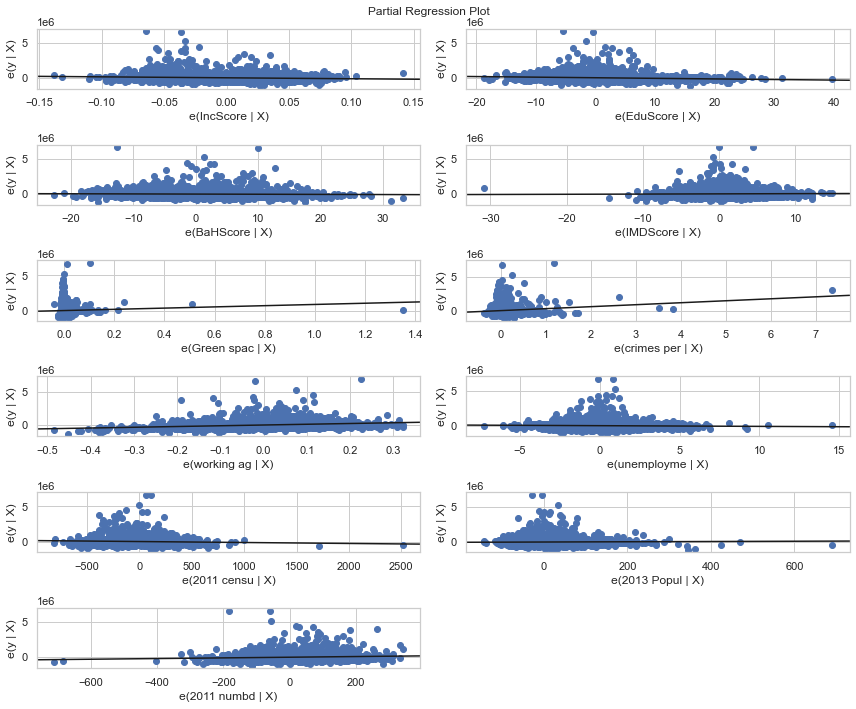

In [45]:
fig = plt.figure(figsize=(12,10))
fig = sm.graphics.plot_partregress_grid(model, fig=fig)

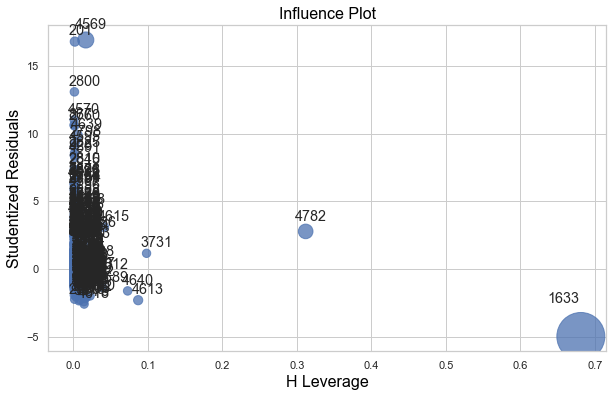

In [46]:
# visualize the influence from each borough
fig, ax = plt.subplots(figsize=(10,6))
fig = sm.graphics.influence_plot(model, ax=ax)

In [47]:
# Influence tests
from statsmodels.stats.outliers_influence import OLSInfluence
test_class = OLSInfluence(model)
test_class.dfbetas[:5,:]

array([[-5.57310583e-03,  3.82210610e-03,  1.20598800e-02,
        -7.82091276e-03, -4.24511389e-04, -8.04673577e-03,
        -8.44750412e-04,  7.01345867e-03, -2.18389505e-02,
         2.15065515e-03,  2.35793053e-02],
       [-4.71937281e-04,  4.85542164e-04,  9.34660858e-04,
        -4.58290417e-04, -7.91243194e-05, -1.19380974e-03,
         3.38738189e-04,  7.39878855e-05, -2.36121824e-03,
        -4.68539620e-04,  2.63195879e-03],
       [-4.39329181e-04,  2.57088328e-03,  9.19538464e-03,
        -2.15275167e-03,  6.40169807e-04, -3.56583592e-03,
        -1.97525022e-03, -2.98797836e-03, -9.80479864e-03,
         8.06592828e-03,  9.34128290e-03],
       [-1.02903161e-02, -1.08750695e-02, -1.28976233e-02,
         7.65834344e-03,  2.22698962e-03,  1.41880782e-02,
        -2.92938292e-02,  1.79729208e-04,  3.22378337e-02,
         1.34017616e-02, -7.24624412e-03],
       [ 2.01536512e-03, -5.42320550e-04, -6.29926781e-03,
         3.76973453e-03,  2.26880897e-04, -6.66108031e-04,
  

In [48]:
fig = sm.graphics.plot_leverage_resid2(model, ax=ax)

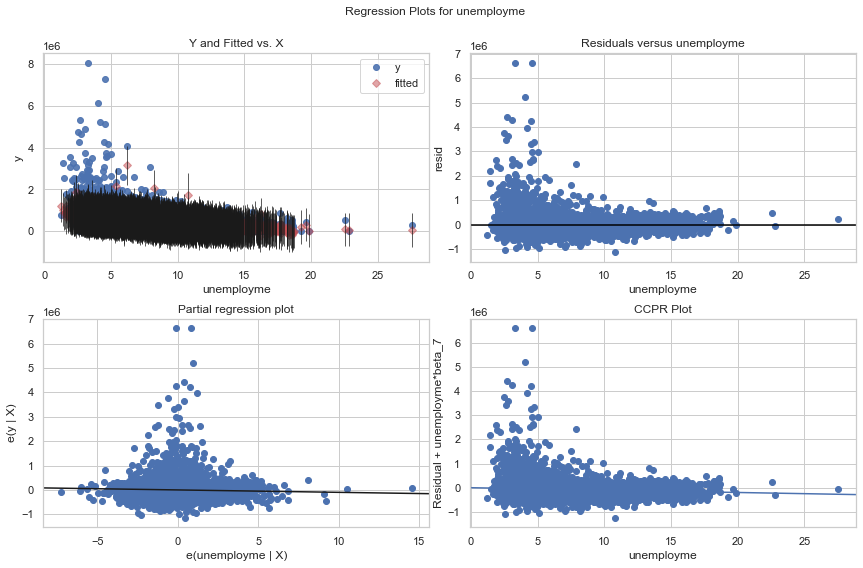

In [49]:
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'unemployme', fig=fig)

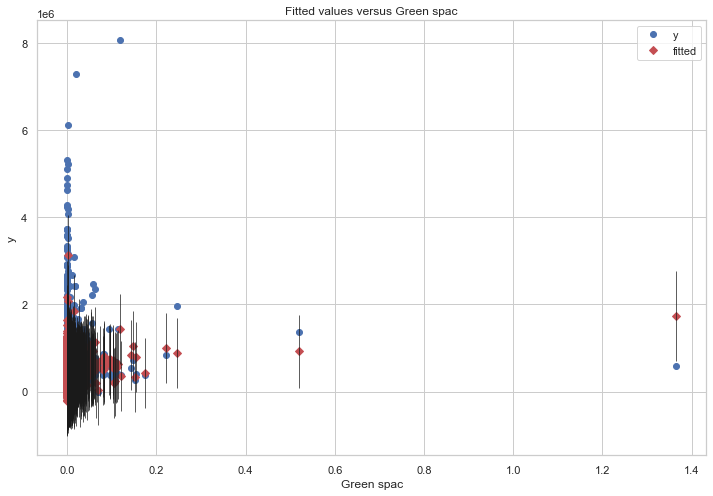

In [50]:
fig, ax = plt.subplots(figsize=(12, 8))
fig = sm.graphics.plot_fit(model, "Green spac", ax=ax)

In [51]:
# download the data from github
# Configure the download
url  = 'https://github.com/cusp-london/Spatial-Data-Analysis/blob/master/lsoa_IMD_airbnb_housing.zip?raw=True'
path = os.path.join("data","lsoa_IMD_airbnb_housing.zip")

# Download
r    = urllib.request.urlretrieve(url, path)

# Unzip it into the data folder
z    = zipfile.ZipFile(path)
m    = z.extractall("data")

gdf=gpd.read_file('data/lsoa_IMD_airbnb_housing/lsoa_IMD_airbnb_housing.shp')
gdf2=gpd.read_file('data/lsoa_IMD_housing3.shp')


In [52]:
gdf2.columns

Index(['Code', 'Area', 'Year', 'Value', 'Measure', 'Names', '2013 Popul',
       '2011 numbd', '2011 censu', '2011 Worki', '2011 emplo', '2011 unemp',
       'Mean Annua', 'unemployme', 'LSOA11NM', 'USUALRES', 'HHOLDRES',
       'COMESTRES', 'POPDEN', 'HHOLDS', 'AVHHOLDSZ', 'IMDScore', 'IncScore',
       'EmpScore', 'EduScore', 'HeaScore', 'CriScore', 'BaHScore', 'EnvScore',
       'Sum green', 'Sum crime', 'Green spac', 'crimes per', 'working ag',
       'geometry'],
      dtype='object')

In [53]:
gdf3=gdf2[['Code','Names','2013 Popul',
       '2011 numbd', '2011 censu', '2011 Worki', '2011 emplo', '2011 unemp',
       'Mean Annua', 'unemployme','Sum green', 'Sum crime', 'Green spac', 'crimes per', 'working ag']]

In [54]:
gdf3

,Code,Names,2013 Popul,2011 numbd,2011 censu,2011 Worki,2011 emplo,2011 unemp,Mean Annua,unemployme,Sum green,Sum crime,Green spac,crimes per,working ag
0,E01000001,City of London 001A,113.559322,876,1465,1082,74.856675,3.526971,74846.177244,3.526971,0.4990,0.0,0.000341,0.000000,0.738567
1,E01000002,City of London 001B,63.704028,830,1436,1024,74.832776,1.727862,73325.389673,1.727862,4.0805,0.0,0.002842,0.000000,0.713092
2,E01000003,City of London 001C,229.610829,817,1346,988,67.150635,4.744526,44130.306111,4.744526,0.0000,0.0,0.000000,0.000000,0.734027
3,E01000005,City of London 001E,61.814346,467,985,694,58.861578,8.679245,30780.838330,8.679245,2.1140,0.0,0.002146,0.000000,0.704569
4,E01000006,Barking and Dagenham 016A,116.916780,543,1703,1176,58.593125,9.496568,46141.120634,9.496568,0.0000,207.0,0.000000,0.121550,0.690546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,120.286396,581,1352,1064,67.401286,10.380623,48386.946316,10.380623,0.0000,115.0,0.000000,0.085059,0.786982
4831,E01033743,Greenwich 002H,21.046848,663,2038,1227,60.063391,10.548523,39272.013115,10.548523,16.2055,517.0,0.007952,0.253680,0.602061
4832,E01033744,Greenwich 007G,128.629857,646,1845,1215,57.400157,11.568409,35936.314172,11.568409,0.0000,253.0,0.000000,0.137127,0.658537
4833,E01033745,Greenwich 002I,34.202128,591,1820,1161,61.544850,9.049774,40848.704721,9.049774,8.8703,237.0,0.004874,0.130220,0.637912


In [55]:
z=gdf.join(gdf3.set_index(['Code']), on=['Code'], how='left')

In [56]:
z

,Code,Area,Year,Value,Measure,LSOA11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,...,2011 Worki,2011 emplo,2011 unemp,Mean Annua,unemployme,Sum green,Sum crime,Green spac,crimes per,working ag
0,E01000001,City of London 001A,Year ending Dec 2017,1204928.0,Mean,City of London 001A,1465,1465,0,112.9,...,1082,74.856675,3.526971,74846.177244,3.526971,0.4990,0.0,0.000341,0.000000,0.738567
1,E01000002,City of London 001B,Year ending Dec 2017,991549.0,Mean,City of London 001B,1436,1436,0,62.9,...,1024,74.832776,1.727862,73325.389673,1.727862,4.0805,0.0,0.002842,0.000000,0.713092
2,E01000003,City of London 001C,Year ending Dec 2017,913007.0,Mean,City of London 001C,1346,1250,96,227.7,...,988,67.150635,4.744526,44130.306111,4.744526,0.0000,0.0,0.000000,0.000000,0.734027
3,E01000005,City of London 001E,Year ending Dec 2017,0.0,Mean,City of London 001E,985,985,0,52.0,...,694,58.861578,8.679245,30780.838330,8.679245,2.1140,0.0,0.002146,0.000000,0.704569
4,E01000006,Barking and Dagenham 016A,Year ending Dec 2017,354300.0,Mean,Barking and Dagenham 016A,1703,1699,4,116.2,...,1176,58.593125,9.496568,46141.120634,9.496568,0.0000,207.0,0.000000,0.121550,0.690546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,Year ending Dec 2017,315553.0,Mean,Greenwich 007F,1352,1352,0,107.6,...,1064,67.401286,10.380623,48386.946316,10.380623,0.0000,115.0,0.000000,0.085059,0.786982
4831,E01033743,Greenwich 002H,Year ending Dec 2017,286682.0,Mean,Greenwich 002H,2038,2038,0,20.4,...,1227,60.063391,10.548523,39272.013115,10.548523,16.2055,517.0,0.007952,0.253680,0.602061
4832,E01033744,Greenwich 007G,Year ending Dec 2017,294493.0,Mean,Greenwich 007G,1845,1728,117,125.8,...,1215,57.400157,11.568409,35936.314172,11.568409,0.0000,253.0,0.000000,0.137127,0.658537
4833,E01033745,Greenwich 002I,Year ending Dec 2017,310000.0,Mean,Greenwich 002I,1820,1820,0,32.3,...,1161,61.544850,9.049774,40848.704721,9.049774,8.8703,237.0,0.004874,0.130220,0.637912


In [57]:
z.columns

Index(['Code', 'Area', 'Year', 'Value', 'Measure', 'LSOA11NM', 'USUALRES',
       'HHOLDRES', 'COMESTRES', 'POPDEN', 'HHOLDS', 'AVHHOLDSZ', 'IMDScore',
       'IncScore', 'EmpScore', 'EduScore', 'HeaScore', 'CriScore', 'BaHScore',
       'EnvScore', 'Mean Price', 'Small Host', 'Multiple L', 'Property C',
       'geometry', 'Names', '2013 Popul', '2011 numbd', '2011 censu',
       '2011 Worki', '2011 emplo', '2011 unemp', 'Mean Annua', 'unemployme',
       'Sum green', 'Sum crime', 'Green spac', 'crimes per', 'working ag'],
      dtype='object')

In [58]:
type(z)

geopandas.geodataframe.GeoDataFrame

In [59]:
# Create the spatial weights matrix
w_queen = Queen.from_dataframe(z)
w_queen.n

4835

In [60]:
print ('%.4f'%w_queen.pct_nonzero) # percentage of non zero queen weights

0.1227


In [61]:
w_queen.histogram

[(1, 2),
 (2, 21),
 (3, 170),
 (4, 636),
 (5, 1186),
 (6, 1308),
 (7, 806),
 (8, 404),
 (9, 190),
 (10, 65),
 (11, 18),
 (12, 15),
 (13, 9),
 (14, 2),
 (15, 3)]

In [62]:
z.loc[z.Area=='Westminster 018B'] # the LSOA King's is based at 

,Code,Area,Year,Value,Measure,LSOA11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,...,2011 Worki,2011 emplo,2011 unemp,Mean Annua,unemployme,Sum green,Sum crime,Green spac,crimes per,working ag
4614,E01004735,Westminster 018B,Year ending Dec 2017,2335004.0,Mean,Westminster 018B,1829,1601,228,38.2,...,1505,56.036585,5.348615,62299.841269,5.348615,0.775,3129.0,0.000424,1.710771,0.822854


In [63]:
w_queen[4614]

{896: 1.0, 4675: 1.0, 900: 1.0, 901: 1.0, 4613: 1.0, 4612: 1.0}

In [64]:
target_lsoa = [4614]
target_lsoa.extend(w_queen.neighbors[4614])
z.loc[target_lsoa]

,Code,Area,Year,Value,Measure,LSOA11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,...,2011 Worki,2011 emplo,2011 unemp,Mean Annua,unemployme,Sum green,Sum crime,Green spac,crimes per,working ag
4614,E01004735,Westminster 018B,Year ending Dec 2017,2335004.0,Mean,Westminster 018B,1829,1601,228,38.2,...,1505,56.036585,5.348615,62299.841269,5.348615,0.7750,3129.0,0.000424,1.710771,0.822854
896,E01000914,Camden 028B,Year ending Dec 2017,912500.0,Mean,Camden 028B,1762,1753,9,39.4,...,1430,60.170604,5.024631,50593.134583,5.024631,4.3810,2013.0,0.002486,1.142452,0.811578
4675,E01032740,City of London 001G,Year ending Dec 2017,949603.0,Mean,City of London 001G,1099,1049,50,17.2,...,991,79.980843,3.269448,67266.444489,3.269448,5.3620,0.0,0.004879,0.000000,0.901729
900,E01000918,Camden 028C,Year ending Dec 2017,1223050.0,Mean,Camden 028C,2090,1885,205,124.3,...,1662,52.500000,7.550483,45819.553978,7.550483,0.0000,1455.0,0.000000,0.696172,0.795215
901,E01000919,Camden 028D,Year ending Dec 2017,1834156.0,Mean,Camden 028D,2014,1658,356,131.8,...,1707,51.864218,4.722222,47265.235983,4.722222,0.5859,1772.0,0.000291,0.879841,0.847567
4613,E01004734,Westminster 018A,Year ending Dec 2017,1186019.0,Mean,Westminster 018A,1972,1931,41,60.7,...,1614,61.556196,8.210181,58245.843699,8.210181,4.2316,8425.0,0.002146,4.272312,0.818458
4612,E01004733,Westminster 020C,Year ending Dec 2017,1402615.0,Mean,Westminster 020C,2046,1796,250,45.3,...,1548,65.745192,5.611390,90193.232555,5.611390,4.8621,1532.0,0.002376,0.748778,0.756598


In [65]:
# Row standardize the matrix
w_queen.transform = 'R'
w_queen[4614]

{896: 0.16666666666666666,
 4675: 0.16666666666666666,
 900: 0.16666666666666666,
 901: 0.16666666666666666,
 4613: 0.16666666666666666,
 4612: 0.16666666666666666}

In [66]:
wqmatrix, ids = w_queen.full()
wqmatrix

array([[0.  , 0.2 , 0.2 , ..., 0.  , 0.  , 0.  ],
       [0.25, 0.  , 0.25, ..., 0.  , 0.  , 0.  ],
       [0.2 , 0.2 , 0.  , ..., 0.  , 0.  , 0.  ],
       ...,
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ]])

In [67]:
n_neighbors = wqmatrix.sum(axis=1) # how many neighbors each region has

In [68]:
n_neighbors[4614]

1.0

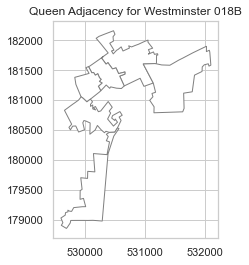

In [69]:
queen_neighs=w_queen.neighbors[4614]
q=z.loc[queen_neighs].plot(edgecolor='grey', facecolor='w')
title=plt.title('Queen Adjacency for Westminster 018B')

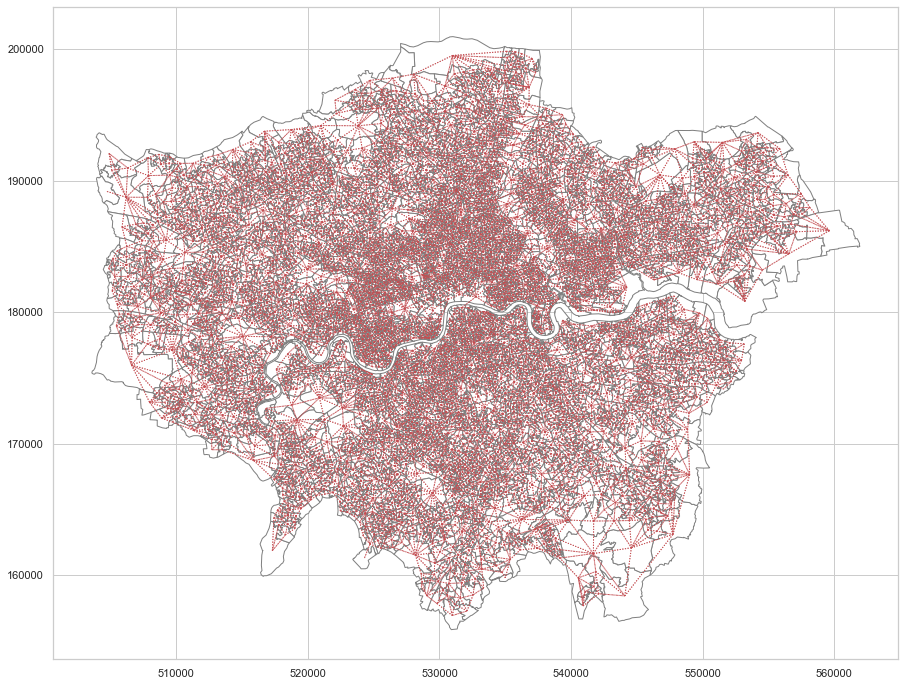

In [70]:
ax = z.plot(edgecolor='grey', facecolor='w', figsize=(20, 12))
f,ax = w_queen.plot(z, ax=ax, 
                   edge_kws=dict(color='r', linestyle=':', linewidth=1),
                   node_kws=dict(marker=''))

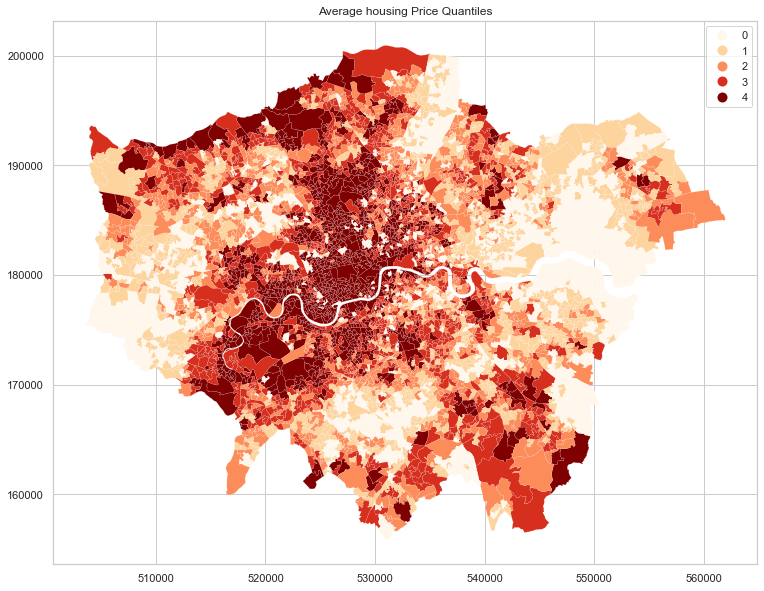

In [71]:
pr = ps.viz.mapclassify.Quantiles(z['Value'], k=5)
f, ax = plt.subplots(1, figsize=(16, 10))
z.assign(cl_pr=pr.yb).plot(column='cl_pr', categorical=True, k=5, cmap='OrRd', 
                                      linewidth=0.1, ax=ax, edgecolor='white', legend=True)

plt.title('Average housing Price Quantiles')
plt.show()
#plt.savefig('ab.png')

In [72]:
w_queen.transform = 'r' # row-standardize the contiguity weights

In [73]:
price_Lag = lps.weights.lag_spatial(w_queen, z['Value']) #spatial lag of the variable
price_LagQ5 = mapclassify.Quantiles(price_Lag, k=5) 

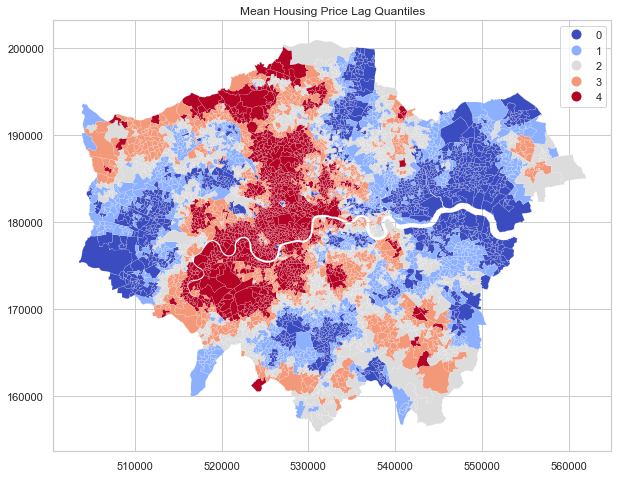

In [74]:
f, ax = plt.subplots(1, figsize=(10, 8))
z.assign(cl_lag=price_LagQ5.yb).plot(column='cl_lag', categorical=True, k=5, cmap='coolwarm', linewidth=0.1, ax=ax, edgecolor='white', legend=True)
plt.title('Mean Housing Price Lag Quantiles')
plt.show()

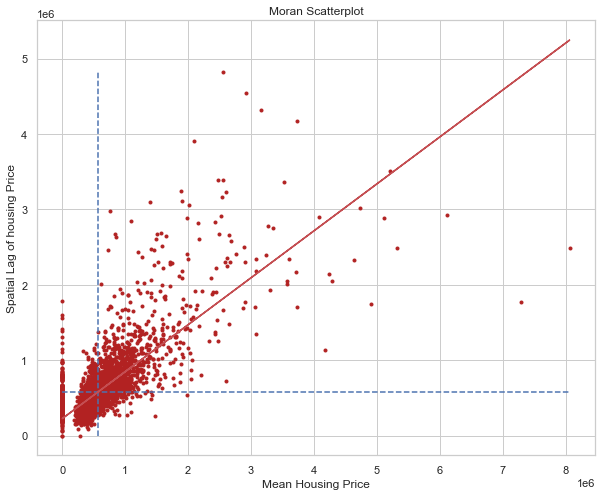

In [75]:
price=z['Value']
b,a = np.polyfit(price, price_Lag, 1)
f, ax = plt.subplots(1, figsize=(10, 8))
plt.plot(price, price_Lag, '.', color='firebrick')

plt.vlines(price.mean(), price_Lag.min(), price_Lag.max(), linestyle='--')
plt.hlines(price_Lag.mean(), price.min(), price.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(price, a + b*price, 'r')
plt.title('Moran Scatterplot')
plt.ylabel('Spatial Lag of housing Price')
plt.xlabel('Mean Housing Price')
plt.show()

In [76]:
z['Value'].median()

467583.00000000006

In [77]:
binary = z['Value']> z['Value'].median()
sum(binary)

2417

In [78]:
labels = ['Low Price', 'High Price']
binary = [labels[i] for i in 1*binary] 
z['binary'] = binary

<AxesSubplot:>

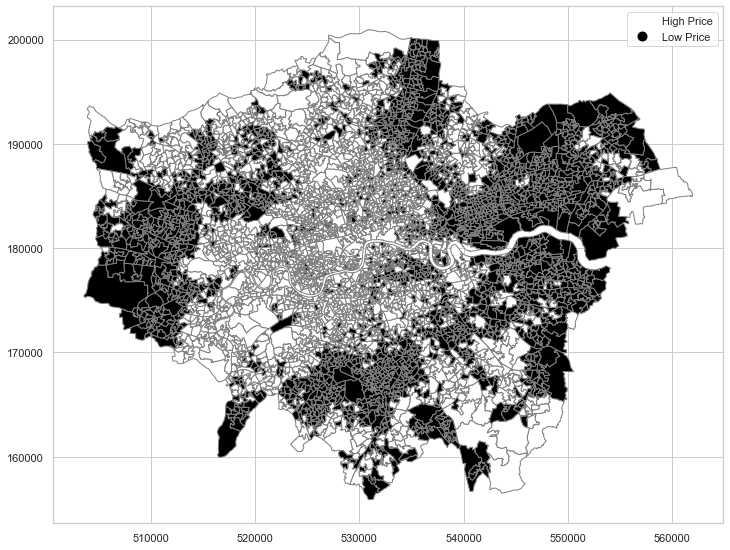

In [79]:
fig = plt.figure(figsize=(12,10))
ax = plt.gca()
z.plot(column='binary', cmap='binary', edgecolor='grey', legend=True, ax=ax)

In [80]:
import esda 
binary = 1 * (z['Value']> z['Value'].median()) # convert back to binary
W_queen = lps.weights.Queen.from_dataframe(z)
W_queen.transform = 'b'
np.random.seed(12345)
jc = esda.join_counts.Join_Counts(binary, W_queen)

In [81]:
jc.bb

5516.0

In [82]:
jc.bw

3431.0

In [83]:
jc.ww

5392.0

In [84]:
jc.p_sim_bb

0.001

In [85]:
mi = esda.moran.Moran(z['Value'], w_queen) # call moran function
mi.I # print out the moran's I value

0.6228190931560792

Text(0.5, 0, "Moran's I")

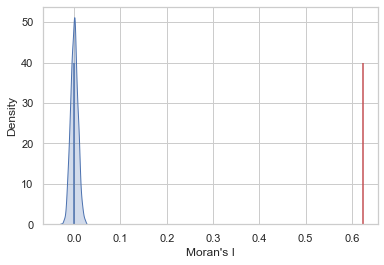

In [86]:
sns.kdeplot(mi.sim, shade=True)
plt.vlines(mi.I, 0, 40, color='r')
plt.vlines(mi.EI, 0, 40)
plt.xlabel("Moran's I")

In [87]:
# Check the statistical significance
mi.p_sim

0.001

In [88]:
I_price = esda.Moran(z['Value'].values, w_queen)  # Moran's I
I_price.I, I_price.p_sim  #value of statistic, inference on Moran's I

(0.6228190931560792, 0.001)

In [89]:
b

0.6228190931560795

In [90]:
I_price.sim[0:5]

array([-0.00540648,  0.01749534,  0.00550698,  0.00866431, -0.00407358])

(-0.1, 0.4)

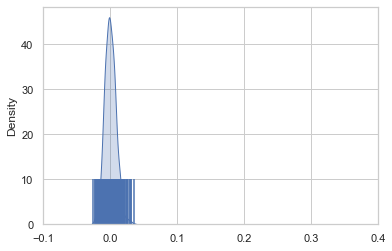

In [91]:
sns.kdeplot(I_price.sim, shade=True)
plt.vlines(I_price.sim, 0, 10)
plt.vlines(I_price.I, 0, 40, 'r')
plt.xlim([-0.1, 0.4])

(-0.1, 0.1)

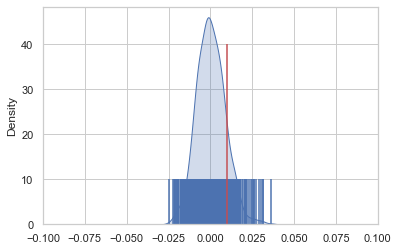

In [92]:
sns.kdeplot(I_price.sim, shade=True)
plt.vlines(I_price.sim, 0, 10)
plt.vlines(I_price.EI+.01, 0, 40, 'r')
plt.xlim([-0.1, 0.1])

In [93]:
lisa = esda.Moran_Local(z['Value'].values, w_queen, permutations=999)
lisa.Is

array([0.91374637, 0.6243885 , 0.56985861, ..., 0.40408389, 0.35325335,
       0.07050295])

In [94]:
lisa.q

array([1, 1, 1, ..., 3, 3, 1])

In [95]:
lisa.p_sim

array([0.075, 0.08 , 0.055, ..., 0.009, 0.007, 0.188])

In [96]:
(lisa.p_sim < 0.05).sum()

1435

In [97]:
z['lag_price'] = lps.weights.lag_spatial(w_queen, z['Value'])
sigs = z['Value'][lisa.p_sim <= .05]
W_sigs = z['lag_price'][lisa.p_sim <= .05]
insigs = z['Value'][lisa.p_sim > .05]
W_insigs = z['lag_price'][lisa.p_sim > .05]

Text(0.5, 0, 'Housing Price')

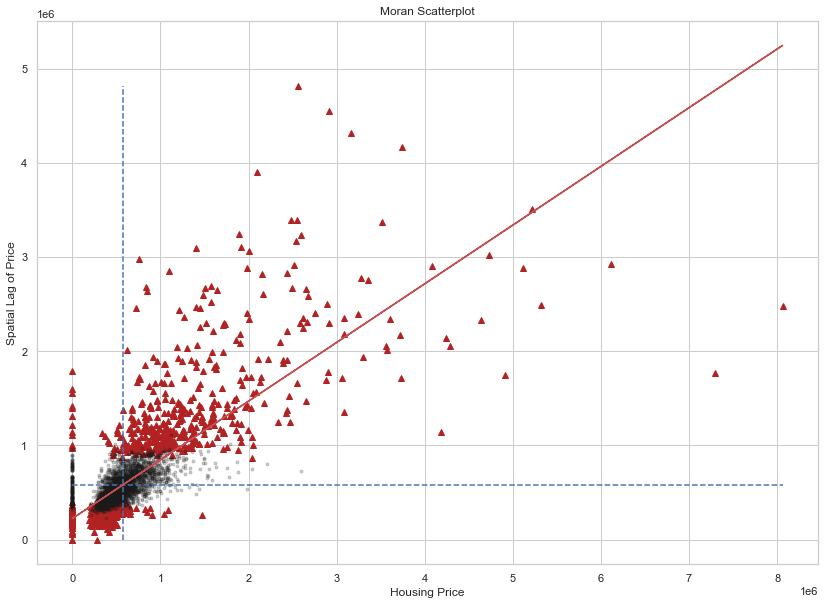

In [98]:
b,a = np.polyfit(z['Value'], z['lag_price'], 1)
moran=esda.Moran(z['Value'].values, w_queen)

fig, ax=plt.subplots(1, figsize=(14,10))
plt.plot(sigs, W_sigs, '^', color='firebrick')
plt.plot(insigs, W_insigs, '.k', alpha=.2)
 
plt.vlines(z['Value'].mean(), z['lag_price'].min(), z['lag_price'].max(), linestyle='--')

plt.hlines(z['lag_price'].mean(), z['Value'].min(), z['Value'].max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(z['Value'], a + b*z['Value'], 'r')

plt.title('Moran Scatterplot')
plt.ylabel('Spatial Lag of Price')
plt.xlabel('Housing Price')

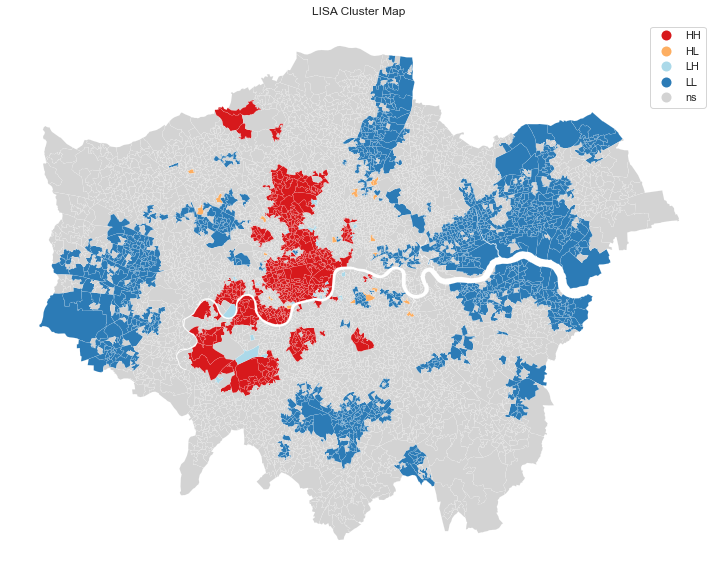

In [99]:
from splot.esda import lisa_cluster
fig, ax=plt.subplots(1, figsize=(14,10))
fig = lisa_cluster(lisa, z, ax=ax)
plt.title("LISA Cluster Map")
plt.show()

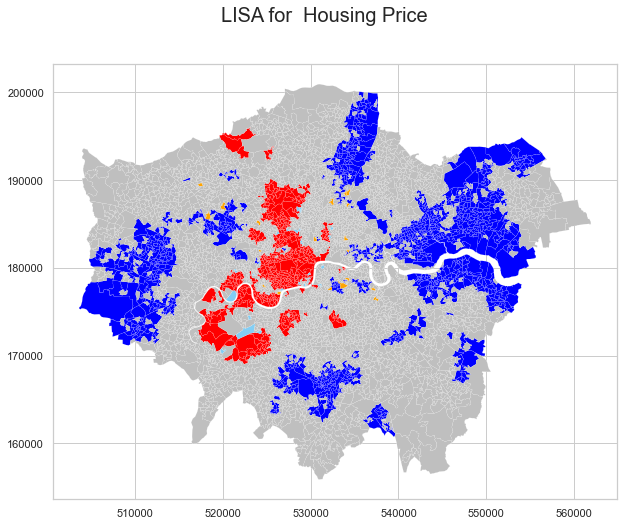

In [100]:
sig = lisa.p_sim < 0.05
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(12, 8))
# Plot building blocks
z.plot(ax=ax, facecolor='1', linewidth=0.1)
# Plot HH clusters
hh = z.loc[(lisa.q==1) & (sig==True), 'geometry']
hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='w')
# Plot LL clusters
ll = z.loc[(lisa.q==3) & (sig==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='w')
# Plot LH clusters
lh = z.loc[(lisa.q==2) & (sig==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='w')
# Plot HL clusters
hl = z.loc[(lisa.q==4) & (sig==True), 'geometry']
hl.plot(ax=ax, color='orange', linewidth=0.1, edgecolor='w')
# Non-significant
ns = z.loc[sig!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='w')
# Style and draw
f.suptitle('LISA for  Housing Price', size=20)
f.set_facecolor('w')
plt.show()

In [101]:
import esda
mi = esda.Moran(z['Mean Price'], w_queen, two_tailed=False)
print("The Statistic Moran's I is: "+str("%.4f"%mi.I),
      "\nThe Expected Value for Statistic I is: "+str("%.4f"%mi.EI),
      "\nThe Significance Test Value is: "+str("%.4f"%mi.p_norm))

The Statistic Moran's I is: 0.1807 
The Expected Value for Statistic I is: -0.0002 
The Significance Test Value is: 0.0000


# GWR

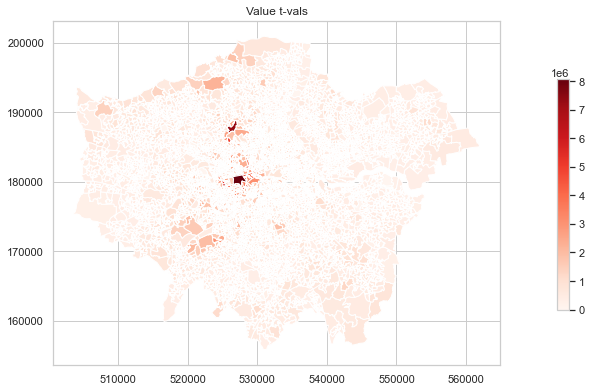

In [102]:
vmin, vmax = np.min(z['Value']), np.max(z['Value']) 
ax = z.plot('Value', vmin=vmin, vmax=vmax, figsize=(8,8), cmap='Reds')
ax.set_title('Value'+' t-vals')
fig = ax.get_figure()
cax = fig.add_axes([1.0, 0.3, 0.02, 0.4]) # the position and size of colormap legend bar
sm_price = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Reds')
sm_price._A = []
fig.colorbar(sm_price, cax=cax)

In [103]:
y = z['Value']
y = np.array(y).reshape(-1,1) # make array change the list format

In [104]:
z.columns

Index(['Code', 'Area', 'Year', 'Value', 'Measure', 'LSOA11NM', 'USUALRES',
       'HHOLDRES', 'COMESTRES', 'POPDEN', 'HHOLDS', 'AVHHOLDSZ', 'IMDScore',
       'IncScore', 'EmpScore', 'EduScore', 'HeaScore', 'CriScore', 'BaHScore',
       'EnvScore', 'Mean Price', 'Small Host', 'Multiple L', 'Property C',
       'geometry', 'Names', '2013 Popul', '2011 numbd', '2011 censu',
       '2011 Worki', '2011 emplo', '2011 unemp', 'Mean Annua', 'unemployme',
       'Sum green', 'Sum crime', 'Green spac', 'crimes per', 'working ag',
       'binary', 'lag_price'],
      dtype='object')

In [105]:
#Design matrix - covariates - intercept added automatically

income_score = np.array(z.IncScore).reshape(-1,1)
educa_score = np.array(z.EduScore).reshape(-1,1)
barri_score = np.array(z.BaHScore).reshape(-1,1)
imd_score = np.array(z.IMDScore).reshape(-1,1)
greenspace_percapita = np.array(z['Green spac']).reshape(-1,1)
crimes_percapita = np.array(z['crimes per']).reshape(-1,1)
workingage_rate = np.array(z['working ag']).reshape(-1,1)
unemployment = np.array(z['unemployme']).reshape(-1,1)
population = np.array(z['2011 censu']).reshape(-1,1)
population_density = np.array(z['2013 Popul']).reshape(-1,1)
households= np.array(z['2011 numbd']).reshape(-1,1) 

X = np.hstack([income_score, educa_score, barri_score, imd_score,greenspace_percapita,crimes_percapita,workingage_rate, unemployment,population, population_density,households])
labels = ['Intercept', 'income_score', 'educa_score', 'barri_score', 'imd_score', 'greenspace_percapita','crimes_percapita','workingage_rate','unemployment','population','population_density','households']

# standardization
X_s = (X - X.mean(axis=0)) / X.std(axis=0)
y_s = (y - y.mean(axis=0)) / y.std(axis=0)

In [106]:
#Coordinates for calibration points
def getXY(pt):
    return (pt.x, pt.y)
centroidseries = z['geometry'].centroid
u,v = [list(t) for t in zip(*map(getXY, centroidseries))]

coords = list(zip(u,v))

In [107]:
#Prepare dataset inputs
g_y = z['Value'].values.reshape((-1,1))
g_X = z[['IncScore','EduScore', 'BaHScore', 'IMDScore','Green spac','crimes per','working ag','unemployme','2011 censu','2013 Popul','2011 numbd']].values

g_coords = list(zip(u,v))

# Standardised our data to have mean of 0 and standard deviation of 1
g_X = (g_X - g_X.mean(axis=0)) / g_X.std(axis=0)

g_y = g_y.reshape((-1,1))

g_y = (g_y - g_y.mean(axis=0)) / g_y.std(axis=0)


In [108]:
from mgwr.sel_bw import Sel_BW

# Select bandwidth for kernel
bw = Sel_BW(g_coords, 
            g_y, # Independent variable
            g_X, # Dependent variable
            fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
            spherical=True) # Spherical coordinates (long-lat) or projected coordinates
# calculate the optimum bandwidth for our local regression
bw.search(bw_min=2)

1333.0

In [109]:
from mgwr.gwr import GWR
#Instantiate GWR model and then estimate parameters and diagnostics using fit method
model = GWR(coords, y, X, bw.bw[0])
results = model.fit()

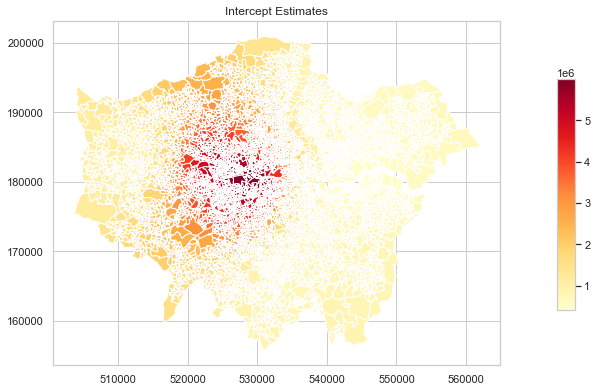

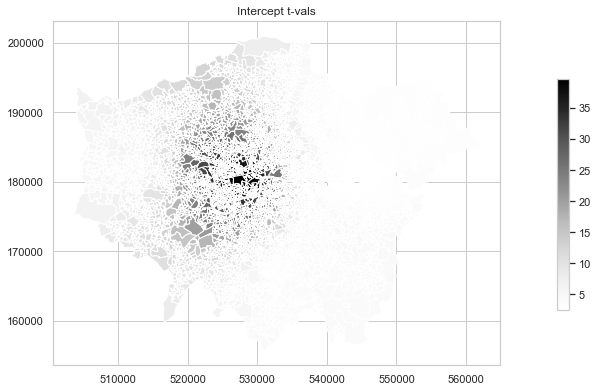

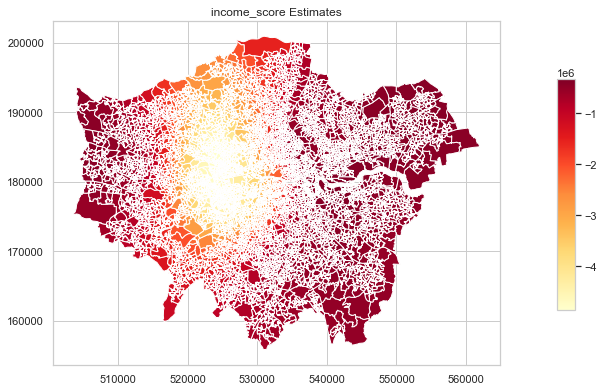

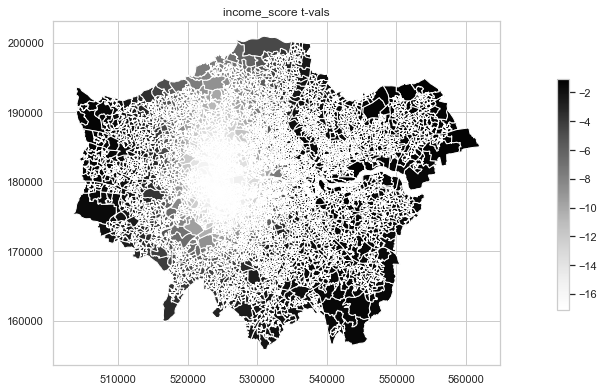

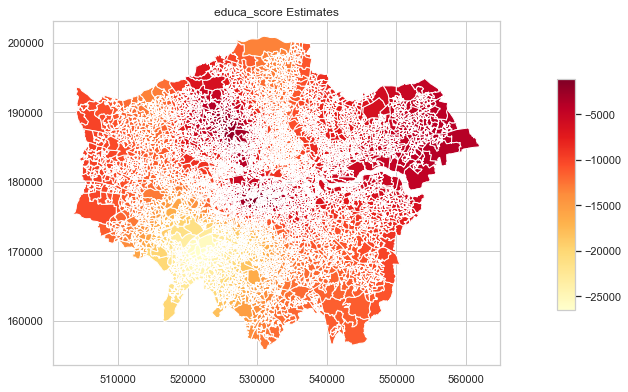

...

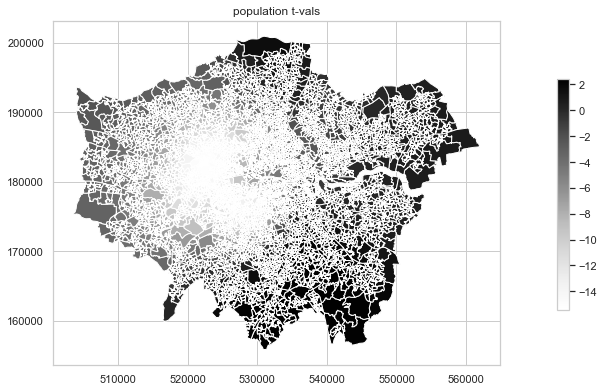

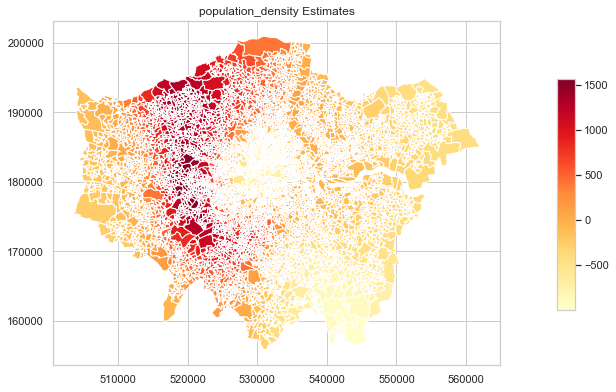

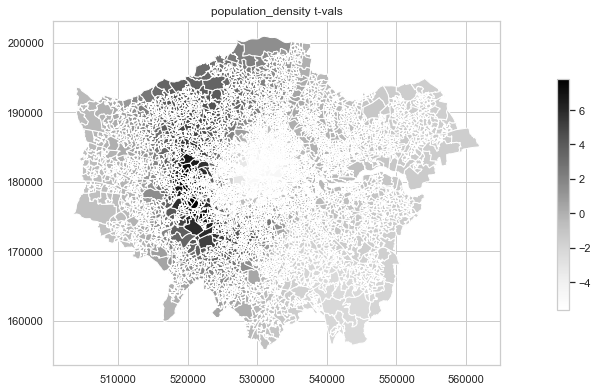

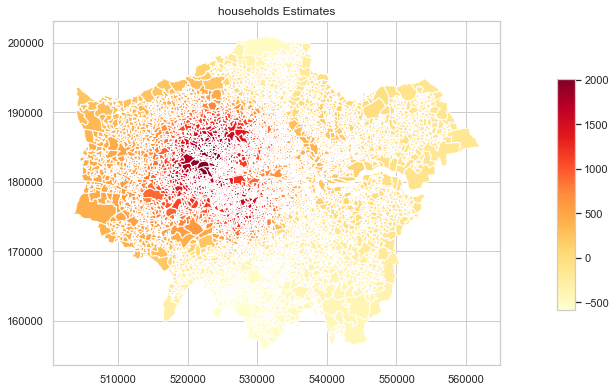

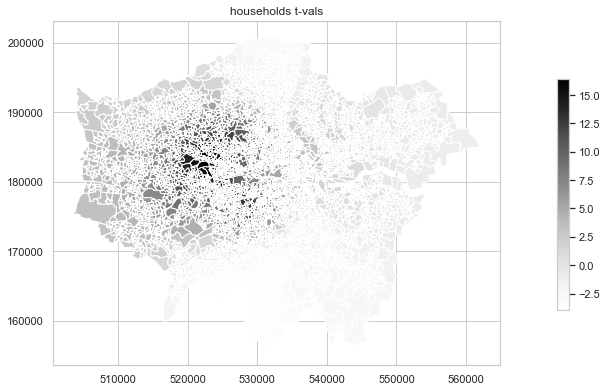

In [110]:
#Map Parameter estimates and T-vals for each covariate
for param in range(results.params.shape[1]):
    z[str(param)] = results.params[:,param]
    vmin, vmax = np.min(z[str(param)]), np.max(z[str(param)]) 
    ax = z.plot(str(param), vmin=vmin, vmax=vmax, figsize=(8,8), cmap='YlOrRd')
    ax.set_title(labels[param] + ' Estimates')
    fig = ax.get_figure()
    cax = fig.add_axes([1.0, 0.3, 0.03, 0.4])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='YlOrRd')
    sm._A = []
    fig.colorbar(sm, cax=cax)
    ax.figure.savefig(labels[param]+'1')
    
    z[str(param)] = results.tvalues[:,param]
    vmin, vmax = np.min(z[str(param)]), np.max(z[str(param)]) 
    ax = z.plot(str(param), vmin=vmin, vmax=vmax, figsize=(8,8), cmap='Greys')
    ax.set_title(labels[param] + ' t-vals')
    fig = ax.get_figure()
    cax = fig.add_axes([1.0, 0.3, 0.02, 0.4])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Greys')
    sm._A = []
    fig.colorbar(sm, cax=cax)
    ax.figure.savefig(labels[param]+'2')

In [111]:
print (len(results.localR2))
print (np.mean(results.localR2))
print (results.localR2)

4835
0.5071259441945786
[[0.61628347]
 [0.61231488]
 [0.61160159]
 ...
 [0.42730412]
 [0.40218304]
 [0.39183198]]


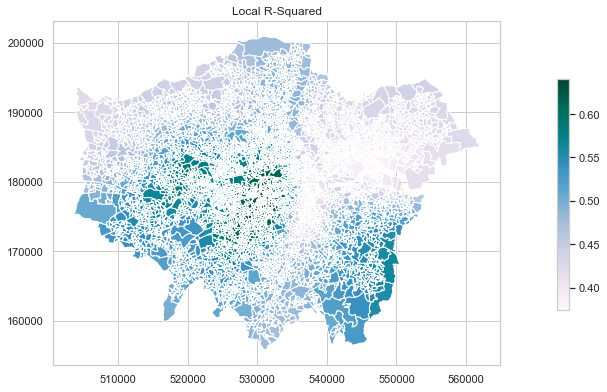

In [112]:
#Map local R-square values which is a weighted R-square at each observation location

z['localR2'] = results.localR2
vmin, vmax = np.min(z['localR2']), np.max(z['localR2']) 
ax = z.plot('localR2', vmin=vmin, vmax=vmax, figsize=(8,8), cmap='PuBuGn')
ax.set_title('Local R-Squared')
fig = ax.get_figure()
cax = fig.add_axes([1.0, 0.3, 0.02, 0.4])
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='PuBuGn')
sm._A = []
fig.colorbar(sm, cax=cax)

ax.figure.savefig('111.png')